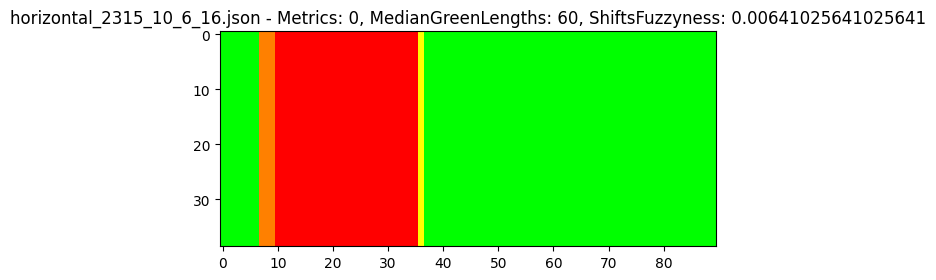

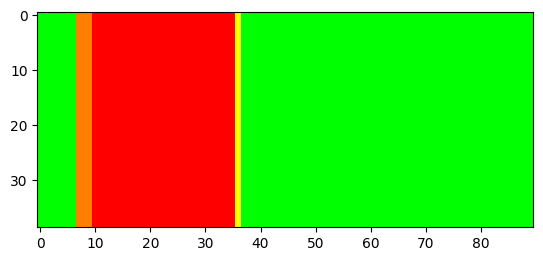

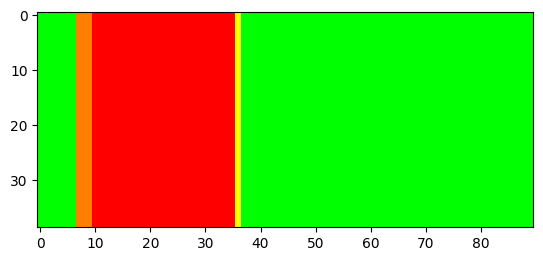

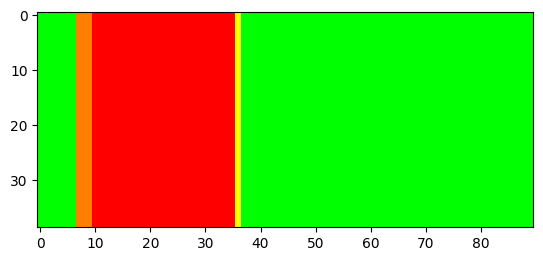

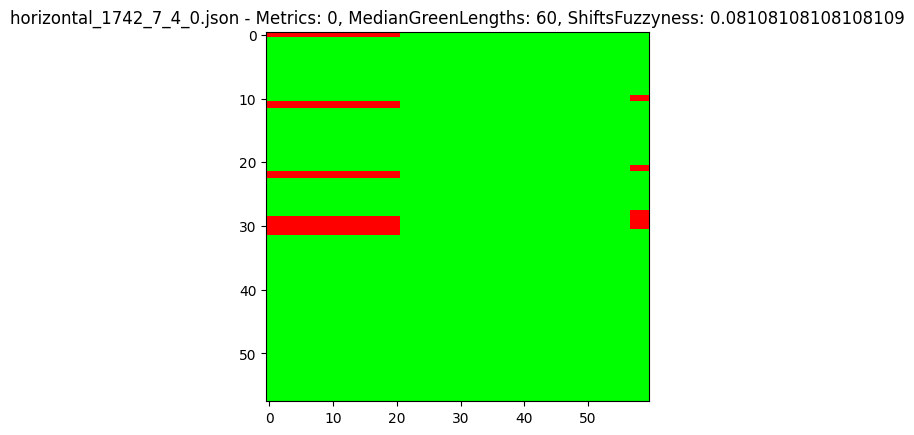

...

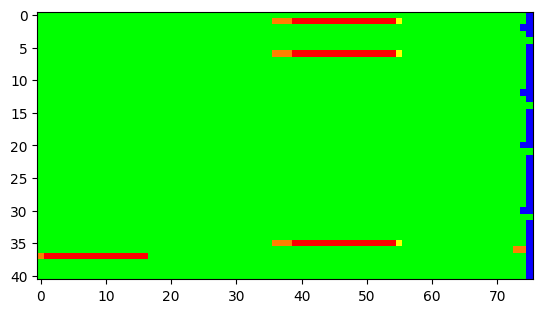

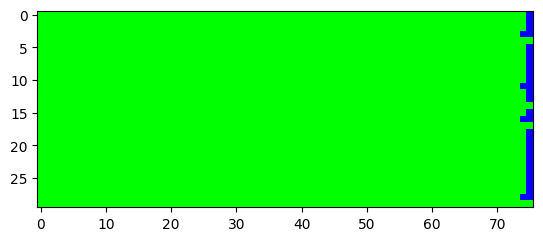

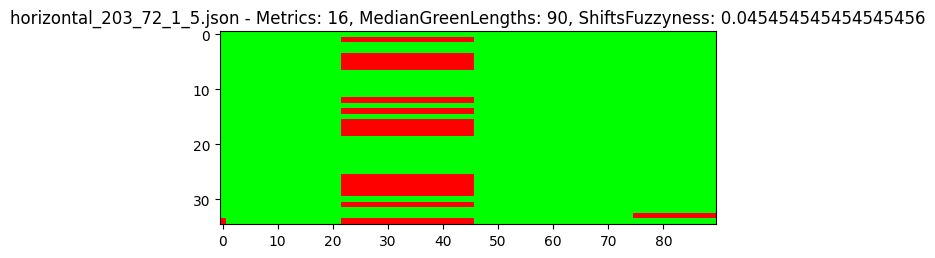

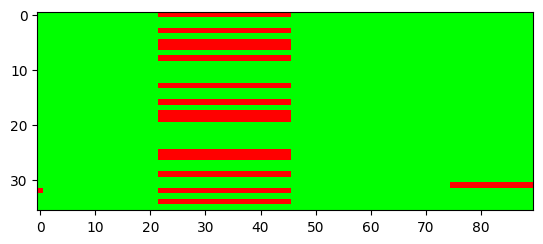

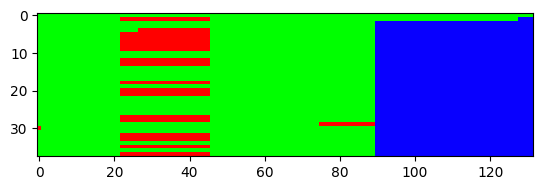

KeyboardInterrupt: 

In [17]:
import json
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random

# 	Color encoding:
#	0 = dark
#	1 = red
#	2 = amber
#	3 = green
#	4 = red amber
#	5 = amber flashing
#	6 = green flashing

color_rgb_map = {
    0: (0, 0, 0),
    1: (255, 0, 0),
    2: (255, 128, 0),
    3: (0, 255, 0),
    4: (255, 255, 0),
    5: (255, 255, 0),
    6: (0, 255, 0),
}

green_states_rgb_map = {
    0: (0, 0, 0),
    1: (0, 255, 0),
}

all_case_studies = []
case_studies_horizontal = []
case_studies_diagonal_lbtrt_1 = []
case_studies_diagonal_lbtrt_2 = []
case_studies_diagonal_lttrb = []

files = os.listdir("case_studies_green_length")
files.sort()

for filename in files:
    if ".json" not in filename:
        continue
    all_case_studies.append(filename)
    
    if "horizontal" in filename:
        case_studies_horizontal.append(filename)
        
    if "diagonal_left_bottom_to_right_top_1" in filename:
        case_studies_diagonal_lbtrt_1.append(filename)
        
    if "diagonal_left_bottom_to_right_top_2" in filename:
        case_studies_diagonal_lbtrt_2.append(filename)
        
    if "diagonal_left_top_to_right_bottom" in filename:
        case_studies_diagonal_lttrb.append(filename)
        
def show_cycles(data, key):
    cycle_sets = data["Cycles"]
    first = True
    total_cycle_count = 0
    for cycle_set in cycle_sets:
        for cycle in cycle_set:
            total_cycle_count += 1
            
    if total_cycle_count < 120:
        return

    for cycle_set in cycle_sets:
        cycle_result_rows = []
        for cycle in cycle_set:
            results_string = cycle["Results"]
            results_string = results_string.replace("[", "")
            results_string = results_string.replace("]", "")
            results = results_string.split(" ")
            colors = [color_rgb_map[int(result)] for result in results]
            cycle_result_rows.append(colors)
        max_cycle_length = max([len(c) for c in cycle_result_rows])
        cycles_reconstructed = []
        for cycle in cycle_result_rows:
            row = cycle
            if len(row) < max_cycle_length:
                row = row + [(8, 0, 255)] * (max_cycle_length - len(row))
            cycles_reconstructed.append(row)
        metrics = data["Metrics"]
        median_green_lengths = data["MedianGreenLengths"]
        shifts_fuzzyness = data["ShiftsFuzzyness"]
        if first: 
            plt.title(f"{key} - Metrics: {metrics}, MedianGreenLengths: {median_green_lengths}, ShiftsFuzzyness: {shifts_fuzzyness}")
            first = False
        plt.imshow(cycles_reconstructed)
        plt.show()
        
def check_lttrb_diagonal_buckets_by_thing_name():
    diagonal_lttrb_by_thing_name = {}
    
    for case_study in case_studies_diagonal_lttrb:
        thing_name = case_study.split("_")[6] + "_" + case_study.split("_")[7]
        if thing_name not in diagonal_lttrb_by_thing_name:
            diagonal_lttrb_by_thing_name[thing_name] = [case_study]
        else:
            diagonal_lttrb_by_thing_name[thing_name].append(case_study)
            
    for thing_name in diagonal_lttrb_by_thing_name:
        if len(diagonal_lttrb_by_thing_name[thing_name]) > 1:
            print(thing_name + ": " + str(len(diagonal_lttrb_by_thing_name[thing_name])))
            for case_study in diagonal_lttrb_by_thing_name[thing_name]:
                with open("case_studies_green_length/" + case_study) as f:
                    data = json.load(f)
                show_cycles(data, case_study)
                
def check_all_types_of_patterns():
    max_case_studies = max(len(case_studies_horizontal), len(case_studies_diagonal_lbtrt_1), len(case_studies_diagonal_lbtrt_2), len(case_studies_diagonal_lttrb))
    i = 0
    while i < max_case_studies: 
        for i in range(0, 10):
            with open("case_studies_green_length/" + case_studies_horizontal[i]) as f:
                data = json.load(f)
            show_cycles(data, case_studies_horizontal[i])
        for i in range(0, 10):
            with open("case_studies_green_length/" + case_studies_diagonal_lbtrt_1[i]) as f:
                data = json.load(f)
            show_cycles(data, case_studies_diagonal_lbtrt_1[i])
        for i in range(0, 10):
            with open("case_studies_green_length/" + case_studies_diagonal_lbtrt_2[i]) as f:
                data = json.load(f)
            show_cycles(data, case_studies_diagonal_lbtrt_2[i])
        for i in range(0, 10):
            with open("case_studies_green_length/" + case_studies_diagonal_lttrb[i]) as f:
                data = json.load(f)
            show_cycles(data, case_studies_diagonal_lttrb[i])
        i += 10
        
def compare_lttrb_diagonal_buckets():
    case_studies_diagonal_lttrb_reverse = case_studies_diagonal_lttrb.copy()
    case_studies_diagonal_lttrb_reverse.reverse()
    
    diagonal_lttrb_bucket_pairs = []
    
    first_bucket = None
    second_bucket = None
    
    for case_study in case_studies_diagonal_lttrb:
        if len(diagonal_lttrb_bucket_pairs) > 10:
            break
        with open("case_studies_green_length/" + case_study) as f:
            data = json.load(f)
        metrics = data["Metrics"]
        median_green_lengths = data["MedianGreenLengths"]
        total = metrics + median_green_lengths
        if metrics < 25:
            first_bucket = case_study
            for case_study2 in case_studies_diagonal_lttrb_reverse:
                with open("case_studies_green_length/" + case_study2) as f:
                    data = json.load(f)
                metrics2 = data["Metrics"]
                median_green_lengths2 = data["MedianGreenLengths"]
                total2 = metrics2 + median_green_lengths2
                if metrics2 > 35 and total2 == total:
                    second_bucket = case_study2
                    diagonal_lttrb_bucket_pairs.append((first_bucket, second_bucket))
                    break
                
    for pair in diagonal_lttrb_bucket_pairs:
        with open("case_studies_green_length/" + pair[0]) as f:
            data = json.load(f)
        show_cycles(data, pair[0])
        with open("case_studies_green_length/" + pair[1]) as f:
            data = json.load(f)
        show_cycles(data, pair[1])
        print("-----------------------------------------------------------------------------------------")
            
def check_horizontal_buckets():
    # Randomize horizontal buckets
    random.shuffle(case_studies_horizontal)
    
    for case_study in case_studies_horizontal:
        with open("case_studies_green_length/" + case_study) as f:
            data = json.load(f)
        show_cycles(data, case_study)
        
check_horizontal_buckets()
    